In [96]:
# Import necessary dependencies
import re
from requests import get
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Dict
import seaborn as sns

pd.set_option("display.max_columns", 300)

In [4]:
%matplotlib inline

### Description

We will use this dataset as an additional data for our hero/build recommendation system.

Main data for our hero/build recommendation system will come from historical matches data.

### Hero stats parsing

In [ ]:
def get_current_hero_stats(
        api_link: str = "https://api.opendota.com/api/heroStats"
) -> List[Dict]:
    """
    Get stats about all heros' performance in recent matches from 'https://api.opendota.com/api/heroStats' or 
    from the different API specifed in `api_link`.

    Parameters
    ----------
    api_link: str
        Link to the API where requests should be sent.
    Returns
    ----------
    response: list[dict]
        The list containing statistics about all heroes' performance in recent matches. 
        [Output format description](https://docs.opendota.com/#tag/hero-stats/operation/get_hero_stats).
    """

    response = get(api_link)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Failed to retrieve data, status code: {response.status_code}")
        return []

In [3]:
# Get the test stats about each hero
test_res = get_current_hero_stats()
print(len(test_res))
test_res[:5]

126


[{'id': 1,
  'name': 'npc_dota_hero_antimage',
  'primary_attr': 'agi',
  'attack_type': 'Melee',
  'roles': ['Carry', 'Escape', 'Nuker'],
  'img': '/apps/dota2/images/dota_react/heroes/antimage.png?',
  'icon': '/apps/dota2/images/dota_react/heroes/icons/antimage.png?',
  'base_health': 120,
  'base_health_regen': 1,
  'base_mana': 75,
  'base_mana_regen': 0,
  'base_armor': 1,
  'base_mr': 25,
  'base_attack_min': 29,
  'base_attack_max': 33,
  'base_str': 21,
  'base_agi': 24,
  'base_int': 12,
  'str_gain': 1.6,
  'agi_gain': 2.8,
  'int_gain': 1.8,
  'attack_range': 150,
  'projectile_speed': 0,
  'attack_rate': 1.4,
  'base_attack_time': 100,
  'attack_point': 0.3,
  'move_speed': 310,
  'turn_rate': None,
  'cm_enabled': True,
  'legs': 2,
  'day_vision': 1800,
  'night_vision': 800,
  'localized_name': 'Anti-Mage',
  '1_pick': 22035,
  '1_win': 11304,
  '2_pick': 63132,
  '2_win': 32432,
  '3_pick': 81238,
  '3_win': 41698,
  '4_pick': 80270,
  '4_win': 40878,
  '5_pick': 60883

In [10]:
heroes_df = pd.DataFrame(test_res).set_index("id")
print(heroes_df.shape)
heroes_df.head()

(126, 59)


,name,primary_attr,attack_type,roles,img,icon,base_health,base_health_regen,base_mana,base_mana_regen,...,turbo_picks_trend,turbo_wins,turbo_wins_trend,pro_pick,pro_win,pro_ban,pub_pick,pub_pick_trend,pub_win,pub_win_trend
id,,,,,,,,,,,,,,,,,,,,,
1,npc_dota_hero_antimage,agi,Melee,"[Carry, Escape, Nuker]",/apps/dota2/images/dota_react/heroes/antimage....,/apps/dota2/images/dota_react/heroes/icons/ant...,120,1.00,75,0.0,...,"[25022, 26104, 21961, 25079, 20694, 21113, 10898]",78385,"[12933, 13672, 11417, 13010, 10805, 10909, 5639]",200,107,381,411597,"[64155, 69032, 60151, 71095, 57804, 58591, 30769]",209541,"[32849, 35097, 30651, 36094, 29366, 29893, 15591]"
2,npc_dota_hero_axe,str,Melee,"[Initiator, Durable, Disabler, Carry]",/apps/dota2/images/dota_react/heroes/axe.png?,/apps/dota2/images/dota_react/heroes/icons/axe...,120,2.50,75,0.0,...,"[26706, 29376, 24322, 28830, 23185, 23319, 11884]",86268,"[13730, 15024, 12509, 14870, 11981, 12063, 6091]",332,150,315,502245,"[77949, 84732, 72534, 87791, 70583, 71505, 37151]",255835,"[39879, 42785, 36911, 44611, 36147, 36485, 19017]"
3,npc_dota_hero_bane,all,Ranged,"[Support, Disabler, Nuker, Durable]",/apps/dota2/images/dota_react/heroes/bane.png?,/apps/dota2/images/dota_react/heroes/icons/ban...,120,0.25,75,0.0,...,"[4901, 5569, 4579, 5625, 4429, 4623, 2218]",14733,"[2276, 2546, 2142, 2572, 2013, 2166, 1018]",87,44,66,72509,"[11071, 12065, 10661, 12847, 10367, 10340, 5158]",35563,"[5442, 5968, 5230, 6234, 5124, 5051, 2514]"
4,npc_dota_hero_bloodseeker,agi,Melee,"[Carry, Disabler, Nuker, Initiator]",/apps/dota2/images/dota_react/heroes/bloodseek...,/apps/dota2/images/dota_react/heroes/icons/blo...,120,0.25,75,0.0,...,"[12317, 12882, 10308, 12433, 9883, 9887, 4798]",35980,"[6076, 6412, 5106, 6144, 4967, 4923, 2352]",106,52,156,147732,"[23664, 25341, 22039, 25627, 20236, 20272, 10553]",75666,"[12239, 12961, 11198, 13069, 10373, 10423, 5403]"
5,npc_dota_hero_crystal_maiden,int,Ranged,"[Support, Disabler, Nuker]",/apps/dota2/images/dota_react/heroes/crystal_m...,/apps/dota2/images/dota_react/heroes/icons/cry...,120,0.25,75,0.0,...,"[24231, 26216, 22426, 26502, 21314, 21348, 10070]",75818,"[12074, 13055, 11178, 13154, 10640, 10703, 5014]",244,131,34,357340,"[55492, 61104, 53172, 62515, 49606, 49694, 25757]",177502,"[27358, 30398, 26561, 31103, 24523, 24670, 12889]"


In [12]:
# Save the information about heroes for current patch
heroes_df.to_csv("data/ignore_folder/hero_stats_7_38b.csv")

### EDA

In [5]:
heroes_df = pd.read_csv("data/ignore_folder/hero_stats_7_38b.csv", index_col=["id"])
heroes_df.head()

,name,primary_attr,attack_type,roles,img,icon,base_health,base_health_regen,base_mana,base_mana_regen,base_armor,base_mr,base_attack_min,base_attack_max,base_str,base_agi,base_int,str_gain,agi_gain,int_gain,attack_range,projectile_speed,attack_rate,base_attack_time,attack_point,move_speed,turn_rate,cm_enabled,legs,day_vision,night_vision,localized_name,1_pick,1_win,2_pick,2_win,3_pick,3_win,4_pick,4_win,5_pick,5_win,6_pick,6_win,7_pick,7_win,8_pick,8_win,turbo_picks,turbo_picks_trend,turbo_wins,turbo_wins_trend,pro_pick,pro_win,pro_ban,pub_pick,pub_pick_trend,pub_win,pub_win_trend
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,npc_dota_hero_antimage,agi,Melee,"['Carry', 'Escape', 'Nuker']",/apps/dota2/images/dota_react/heroes/antimage....,/apps/dota2/images/dota_react/heroes/icons/ant...,120,1.00,75,0.0,1,25,29,33,21,24,12,1.6,2.8,1.8,150,0,1.4,100,0.30,310,NaN,True,2,1800,800,Anti-Mage,22035,11304,63132,32432,81238,41698,80270,40878,60883,31072,37662,18898,21896,10885,11092,5578,150871,"[25022, 26104, 21961, 25079, 20694, 21113, 10898]",78385,"[12933, 13672, 11417, 13010, 10805, 10909, 5639]",200,107,381,411597,"[64155, 69032, 60151, 71095, 57804, 58591, 30769]",209541,"[32849, 35097, 30651, 36094, 29366, 29893, 15591]"
2,npc_dota_hero_axe,str,Melee,"['Initiator', 'Durable', 'Disabler', 'Carry']",/apps/dota2/images/dota_react/heroes/axe.png?,/apps/dota2/images/dota_react/heroes/icons/axe...,120,2.50,75,0.0,0,25,31,35,25,20,18,2.8,1.7,1.6,150,900,1.7,100,0.40,315,NaN,True,2,1800,800,Axe,28288,15031,77076,40011,98635,50618,97696,49093,74737,37535,46765,23167,27740,13906,13065,6507,167622,"[26706, 29376, 24322, 28830, 23185, 23319, 11884]",86268,"[13730, 15024, 12509, 14870, 11981, 12063, 6091]",332,150,315,502245,"[77949, 84732, 72534, 87791, 70583, 71505, 37151]",255835,"[39879, 42785, 36911, 44611, 36147, 36485, 19017]"
3,npc_dota_hero_bane,all,Ranged,"['Support', 'Disabler', 'Nuker', 'Durable']",/apps/dota2/images/dota_react/heroes/bane.png?,/apps/dota2/images/dota_react/heroes/icons/ban...,120,0.25,75,0.0,1,25,24,30,23,23,23,2.7,2.7,2.7,400,900,1.7,100,0.30,305,NaN,True,4,1800,1200,Bane,3758,1763,9026,4349,11767,5646,12391,6100,10463,5220,7639,3848,5419,2767,4110,2121,31944,"[4901, 5569, 4579, 5625, 4429, 4623, 2218]",14733,"[2276, 2546, 2142, 2572, 2013, 2166, 1018]",87,44,66,72509,"[11071, 12065, 10661, 12847, 10367, 10340, 5158]",35563,"[5442, 5968, 5230, 6234, 5124, 5051, 2514]"
4,npc_dota_hero_bloodseeker,agi,Melee,"['Carry', 'Disabler', 'Nuker', 'Initiator']",/apps/dota2/images/dota_react/heroes/bloodseek...,/apps/dota2/images/dota_react/heroes/icons/blo...,120,0.25,75,0.0,2,25,35,41,24,24,17,2.7,3.1,2.0,150,900,1.7,100,0.43,285,NaN,True,2,1800,800,Bloodseeker,14032,7170,25682,13292,26253,13510,23523,12082,16452,8438,9859,5063,5600,2787,2703,1330,72508,"[12317, 12882, 10308, 12433, 9883, 9887, 4798]",35980,"[6076, 6412, 5106, 6144, 4967, 4923, 2352]",106,52,156,147732,"[23664, 25341, 22039, 25627, 20236, 20272, 10553]",75666,"[12239, 12961, 11198, 13069, 10373, 10423, 5403]"
5,npc_dota_hero_crystal_maiden,int,Ranged,"['Support', 'Disabler', 'Nuker']",/apps/dota2/images/dota_react/heroes/crystal_m...,/apps/dota2/images/dota_react/heroes/icons/cry...,120,0.25,75,0.0,0,25,30,36,17,16,18,2.2,1.8,3.3,600,900,1.7,100,0.45,280,NaN,True,2,1800,800,Crystal Maiden,23530,12170,57473,28960,68186,33582,64673,31873,49966,24493,32145,15655,19679,9597,11676,5846,152107,"[24231, 26216, 22426, 26502, 21314, 21348, 10070]",75818,"[12074, 13055, 11178, 13154, 10640, 10703, 5014]",244,131,34,357340,"[55492, 61104, 53172, 62515, 49606, 49694, 25757]",177502,"[27358, 30398, 26561, 31103, 24523, 24670, 12889]"


In [6]:
# Check the column types
heroes_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 126 entries, 1 to 145
Data columns (total 59 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               126 non-null    object 
 1   primary_attr       126 non-null    object 
 2   attack_type        126 non-null    object 
 3   roles              126 non-null    object 
 4   img                126 non-null    object 
 5   icon               126 non-null    object 
 6   base_health        126 non-null    int64  
 7   base_health_regen  125 non-null    float64
 8   base_mana          126 non-null    int64  
 9   base_mana_regen    126 non-null    float64
 10  base_armor         126 non-null    int64  
 11  base_mr            126 non-null    int64  
 12  base_attack_min    126 non-null    int64  
 13  base_attack_max    126 non-null    int64  
 14  base_str           126 non-null    int64  
 15  base_agi           126 non-null    int64  
 16  base_int           126 non-null

#### Missing values

In [7]:
# Check columns with NaN values
nan_cols = heroes_df.isna().sum()
nan_cols = nan_cols.loc[nan_cols > 0]
nan_cols

base_health_regen     1
turn_rate            82
dtype: int64

In [8]:
# Check if all hero names have the same beginning
heroes_df.loc[:, "name"].apply(lambda x: tuple(x.split("_")[:3])).unique()

array([('npc', 'dota', 'hero')], dtype=object)

In [9]:
# Transform all hero names in appropriate format
heroes_df["name"] = heroes_df.loc[:, "name"].apply(lambda x: "_".join(x.split("_")[3:]))
heroes_df.loc[:, "name"].head()

id
1          antimage
2               axe
3              bane
4       bloodseeker
5    crystal_maiden
Name: name, dtype: object

In [10]:
heroes_df.loc[heroes_df.loc[:, "name"] == "undying", "base_health_regen"]

id
85   NaN
Name: base_health_regen, dtype: float64

Undying is the only hero in the game with negative base health regen (-0.25). [Source](https://liquipedia.net/dota2/Health_Regeneration). However, this information is not reliable. So, due to only one occurence of NaN value we can take information from this website.

In [ ]:
# Fill the base health regeneration value for Undying
heroes_df["base_health_regen"] = heroes_df.loc[:, "base_health_regen"].fillna(-0.25)
heroes_df.loc[:, "base_health_regen"].isna().sum()

np.int64(0)

In [11]:
# Check heroes with no turn rate specified
heroes_df.loc[heroes_df.loc[:, "turn_rate"].isna(), "name"].sort_values()

id
108     abyssal_underlord
73              alchemist
68     ancient_apparition
1                antimage
2                     axe
              ...        
37                warlock
63                 weaver
112         winter_wyvern
30           witch_doctor
22                   zuus
Name: name, Length: 82, dtype: object

We are parse missing turn rates from Wikipedia (fandom). However, the information on this website is not really reliable.
So, we decided to omit this variable from our dataset.

In [12]:
heroes_df = heroes_df.drop(labels=["turn_rate"], axis=1)
heroes_df.shape

(126, 58)

#### Note
Since all heroes have:
- base health = 200;
- base magic resist (mr) = 25.

We can remove these variables.

In [13]:
print(heroes_df.loc[:, "base_health"].unique())
print(heroes_df.loc[:, "base_mr"].unique())

[120]
[25]


In [14]:
heroes_df = heroes_df.drop(labels=["base_health", "base_mr"], axis=1)
heroes_df.shape

(126, 56)

#### Variables types
In our dataset we have 4 variable types:
- `Numerical`: int, float - all numerical data;
- `Object`: str - Non-numerical data with large amount of unique values;
- `List`: int - Numerical/Non-numerical data composed in lists for each row;
- `Categorical`: str - Non-numerical data with limited amount of unique values that can be divided into categories.

In [15]:
# Select numerical data
numerical_cols = heroes_df.select_dtypes(include=["int", "float"]).columns.values
numerical_cols

array(['base_health_regen', 'base_mana', 'base_mana_regen', 'base_armor',
       'base_attack_min', 'base_attack_max', 'base_str', 'base_agi',
       'base_int', 'str_gain', 'agi_gain', 'int_gain', 'attack_range',
       'projectile_speed', 'attack_rate', 'base_attack_time',
       'attack_point', 'move_speed', 'legs', 'day_vision', 'night_vision',
       '1_pick', '1_win', '2_pick', '2_win', '3_pick', '3_win', '4_pick',
       '4_win', '5_pick', '5_win', '6_pick', '6_win', '7_pick', '7_win',
       '8_pick', '8_win', 'turbo_picks', 'turbo_wins', 'pro_pick',
       'pro_win', 'pro_ban', 'pub_pick', 'pub_win'], dtype=object)

In [16]:
# Select data that contains lists of values
list_cols = np.array([col for col in heroes_df.columns.values if col.split("_")[-1] == "trend"], dtype="object")

# Append "roles"
list_cols = np.append(list_cols, "roles")
list_cols

array(['turbo_picks_trend', 'turbo_wins_trend', 'pub_pick_trend',
       'pub_win_trend', 'roles'], dtype=object)

In [17]:
# Select object and categorical data
unique_val_threshold = 30

obj_cols = np.array([col for col in heroes_df.select_dtypes(include=["object"]).columns.values if col not in list_cols], dtype="object")
cat_cols = np.array([col for col in obj_cols if heroes_df.loc[:, col].unique().shape[0] <= unique_val_threshold], dtype="object")
obj_cols = np.array([col for col in obj_cols if col not in cat_cols], dtype="object")

print(obj_cols)
print(cat_cols)

['name' 'img' 'icon' 'localized_name']
['primary_attr' 'attack_type']


#### Basic data distribution

In [18]:
heroes_df.loc[:, numerical_cols].describe()

,base_health_regen,base_mana,base_mana_regen,base_armor,base_attack_min,base_attack_max,base_str,base_agi,base_int,str_gain,agi_gain,int_gain,attack_range,projectile_speed,attack_rate,base_attack_time,attack_point,move_speed,legs,day_vision,night_vision,1_pick,1_win,2_pick,2_win,3_pick,3_win,4_pick,4_win,5_pick,5_win,6_pick,6_win,7_pick,7_win,8_pick,8_win,turbo_picks,turbo_wins,pro_pick,pro_win,pro_ban,pub_pick,pub_win
count,125.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.00000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.00000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000
mean,0.618000,74.761905,0.121032,0.611111,26.150794,32.722222,21.190476,18.357143,19.920635,2.660317,2.169841,2.42619,350.753968,972.222222,1.693651,101.746032,0.403571,300.317460,2.063492,1790.476190,828.571429,13400.952381,6700.47619,35086.746032,17543.373016,46156.190476,23078.095238,47940.873016,23970.436508,39042.142857,19521.071429,26228.650794,13114.325397,16606.190476,8303.095238,10358.412698,5179.206349,105330.396825,52665.198413,218.269841,109.158730,264.650794,254922.936508,127461.468254
std,0.572008,7.819390,0.215903,1.314365,7.214505,7.464732,3.321962,4.785753,4.221096,0.623292,0.767048,0.87619,197.625978,462.268561,0.090108,6.459643,0.097047,14.446398,1.157556,90.711474,144.696727,9432.562761,4830.38595,25582.380620,13063.128396,33890.967566,17260.698086,35085.408340,17811.786718,28472.978111,14403.844917,19072.990610,9655.227083,12220.980009,6161.951095,7874.208524,3982.906112,82573.939341,41815.340094,149.010841,78.760743,259.206522,177355.104880,89934.744015
min,0.250000,0.000000,0.000000,-2.000000,12.000000,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,150.000000,0.000000,1.400000,90.000000,0.170000,275.000000,0.000000,800.000000,800.000000,941.000000,387.00000,2045.000000,818.000000,2326.000000,954.000000,2263.000000,932.000000,1641.000000,728.000000,1134.000000,507.000000,746.000000,332.000000,690.000000,319.000000,13238.000000,5298.000000,10.000000,6.000000,5.000000,14851.000000,6425.000000
25%,0.250000,75.000000,0.000000,0.000000,21.250000,28.000000,19.000000,15.000000,17.000000,2.225000,1.600000,1.80000,150.000000,900.000000,1.700000,100.000000,0.307500,290.000000,2.000000,1800.000000,800.000000,6184.250000,3062.25000,15482.000000,7139.250000,20636.750000,9970.250000,20843.250000,10201.000000,16247.250000,8241.500000,10980.500000,5289.000000,7077.500000,3360.750000,3951.000000,1963.500000,50569.250000,24572.500000,102.250000,50.500000,74.750000,119645.500000,58883.750000
50%,0.250000,75.000000,0.000000,0.000000,26.000000,32.000000,21.000000,18.000000,20.000000,2.600000,2.000000,2.15000,340.000000,900.000000,1.700000,100.000000,0.400000,300.000000,2.000000,1800.000000,800.000000,10892.500000,5381.50000,27307.000000,13740.500000,37289.500000,18483.000000,39138.000000,19747.500000,32843.000000,16305.500000,21532.000000,11039.000000,13186.000000,6736.000000,8513.000000,4076.500000,81617.000000,40938.000000,191.500000,93.500000,175.500000,209140.500000,108827.000000
75%,1.000000,75.000000,0.250000,1.000000,30.000000,37.000000,23.000000,22.000000,23.000000,3.000000,2.800000,3.10000,550.000000,1100.000000,1.700000,100.000000,0.500000,310.000000,2.000000,1800.000000,800.000000,17840.750000,9068.75000,48188.000000,24257.750000,62392.750000,31713.000000,64507.500000,33143.500000,52738.750000,28015.500000,37098.750000,18855.000000,22954.750000,11407.750000,14519.750000,7373.750000,134963.500000,66135.250000,290.250000,148.250000,347.750000,342193.750000,177014.000000
max,3.000000,120.000000,1.000000,5.000000,60.000000,68.000000,30.000000,34.000000,30.000000,4.300000,4.000000,5.20000,675.000000,3000.000000

In [19]:
def plot_dist(df: pd.DataFrame, max_cols: int = 4, figsize: tuple[int, int] = (14, 8), bar_type: str = "bar", num_bins: int = 20,
              image_name: str = "dist.png") -> None:
    """
    Plot numerical and non-numerical data distributions.

    Parameters
    ----------
    df: pd.DataFrame
        Dataframe with data.
    max_cols: int
        Maximal amount of column in the plot.
    figsize: tuple[int, int]
        The size of the plot.
    bar_type: str
        Type of the bar for categorical data.
    num_bins: int
        Amount of bins to plot for numerical data.
    
    Returns
    ----------
    None
    """

    plot_count = df.columns.values.shape[0]

    n_rows = plot_count // max_cols + (1 if plot_count % max_cols > 0 else 0)

    fig, ax = plt.subplots(n_rows, max_cols, figsize=figsize)
    plot_counter = 0

    if n_rows == 1:
        for sub_ax in ax:
  
            if plot_counter == plot_count:
                break
            
            col = df.columns.values[plot_counter]
            if np.issubdtype(df[col].dtype, np.number):
                # Plot histogram for numerical variables
                sub_ax.hist(df[col].dropna(), bins=num_bins, edgecolor='black')
                sub_ax.set_xlabel("Value")
                sub_ax.set_ylabel("Frequency")
            else:
                # Plot bar plot for categorical variables
                values = df[col].value_counts()
                if bar_type == "bar":
                    sub_ax.bar(values.index, values.values)
                elif bar_type == "barh":
                    sub_ax.barh(values.index, values.values)
                else:
                    raise Exception("Incorrect bar type chosen")

                sub_ax.set_xlabel("Count")
                sub_ax.set_ylabel("Feature value")

            sub_ax.set_title(col)
            plot_counter += 1
    else:
        for row in ax:
            for sub_ax in row:

                if plot_counter == plot_count:
                    break
                
                col = df.columns.values[plot_counter]
                if np.issubdtype(df[col].dtype, np.number):
                    # Plot histogram for numerical variables
                    sub_ax.hist(df[col].dropna(), bins=num_bins, edgecolor='black')
                    sub_ax.set_xlabel("Value")
                    sub_ax.set_ylabel("Frequency")
                else:
                    # Plot bar plot for categorical variables
                    values = df[col].value_counts()
                    if bar_type == "bar":
                        sub_ax.bar(values.index, values.values)
                    elif bar_type == "barh":
                        sub_ax.barh(values.index, values.values)
                    else:
                        raise Exception("Incorrect bar type chosen")

                    sub_ax.set_xlabel("Count")
                    sub_ax.set_ylabel("Feature value")

                sub_ax.set_title(col)
                plot_counter += 1

    plt.tight_layout()
    plt.savefig(image_name)
    plt.show()

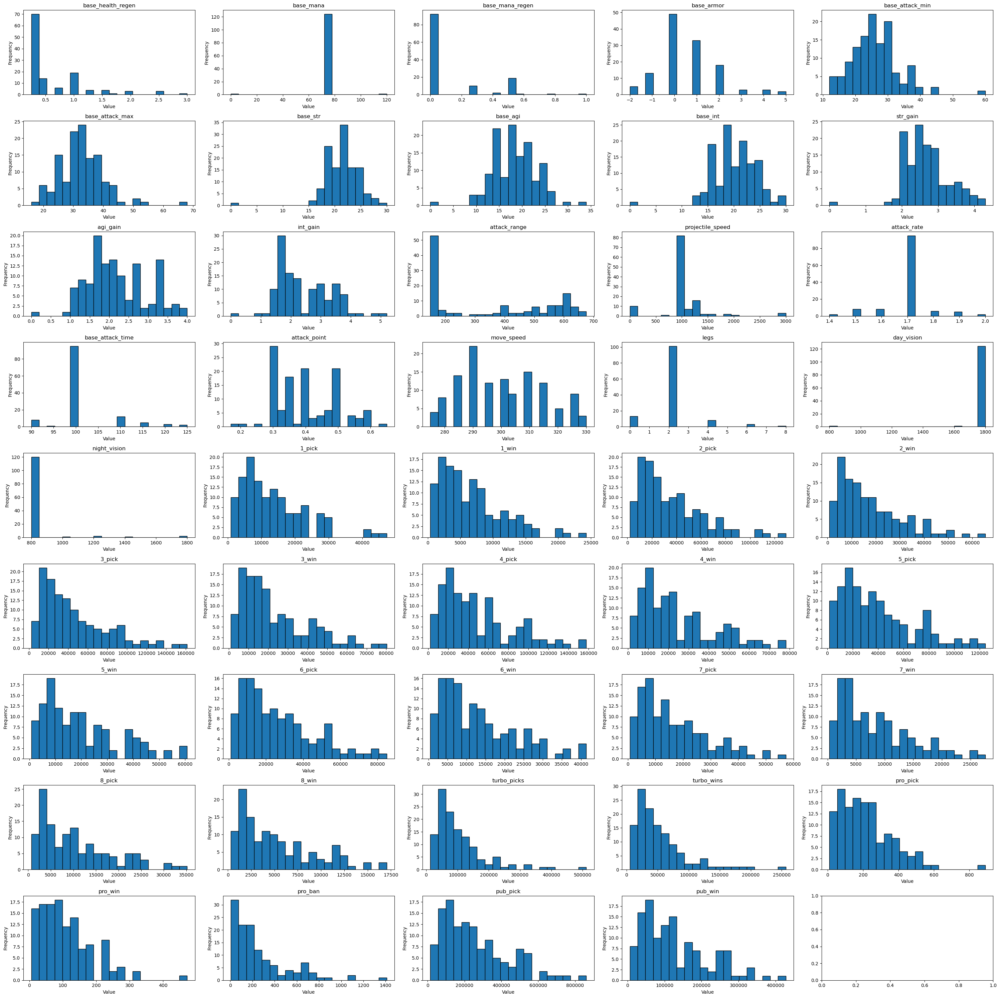

In [20]:
# Plot distributions for all numerical columns
plot_dist(heroes_df.loc[:, numerical_cols], max_cols=5, figsize=(30, 30))

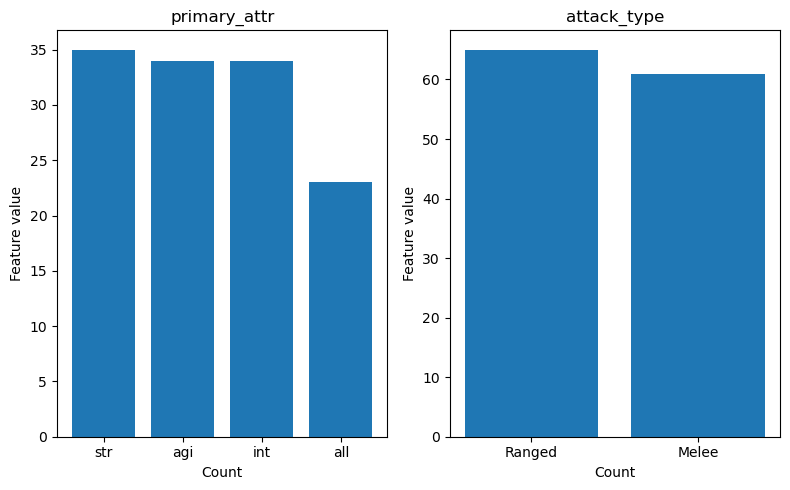

In [21]:
# Plot distributions for all categorical columns
plot_dist(heroes_df.loc[:, cat_cols], max_cols=2, figsize=(8, 5))

<Axes: >

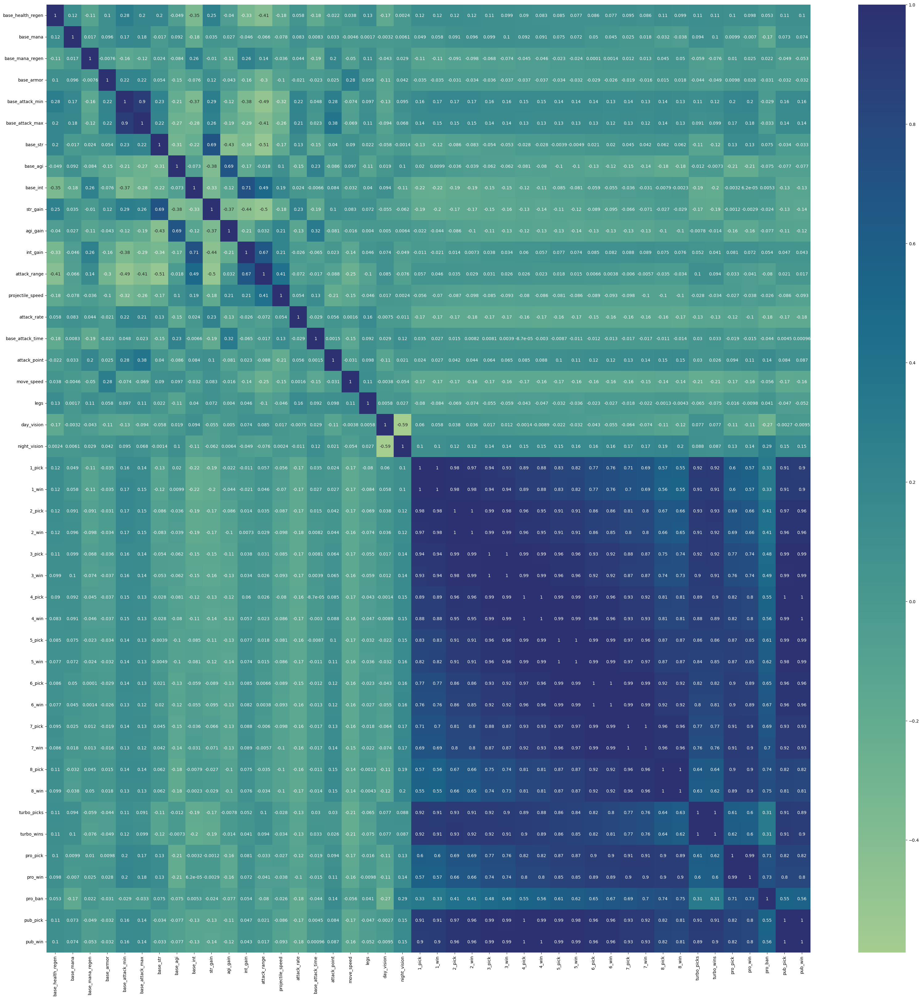

In [ ]:
# Correlation heatmap between numerical variables
fig, ax = plt.subplots(figsize=(40, 40))
sns.heatmap(heroes_df.loc[:, numerical_cols].corr(), ax=ax, annot=True, cmap="crest")

### Results & Considerations so far

#### Numerical features

Some numerical features have a strictly limited amount of values, so we can treat them as categories.

As we can see from the distributions plot we may consider the following modifications to our data:
- `base_mana` can be removed due to 99% of it being the same value;
- `attack_rate` can be divided into 3 categories: "below mean"(0), "mean"(1), "above mean"(2) & encoded ordinally in ascending order;
- `base_attack_time` can be modifed in the same way as `attack_rate`;
- `legs` is a purely cosmetical feature that has no impact on the game. Additionally, this feature has weak correlation with other features. So, it can be omitted;
- `day_vision` & `night_vision` can be omitted on the same terms as `base_mana`;
- `<>_win` / `<>_pick`: each of these pair has a high in-between correlation. Each pair represents pickrate/winrate for each rank. So, we will only use one (two at most) pair(s) for item/build recommendation. Each pair can be combined into one feature or one of its sub-features may be removed.

#### Outliers

Due to the nature of our data, outliers may present. Some heroes have unique properties that are reflected in some of their stats. From our point of view, we may not remove the outliers.

#### Categorical features

Categorical features have good distributions & do not require advanced preprocessing so far.

In [24]:
# Base mana
heroes_df.loc[:, "base_mana"].value_counts()

base_mana
75     124
0        1
120      1
Name: count, dtype: int64

In [28]:
# Attack rate
print(heroes_df.loc[:, "attack_rate"].value_counts())
heroes_df.loc[:, "attack_rate"].value_counts().max() / heroes_df.shape[0]

attack_rate
1.7    95
1.5     8
1.6     8
1.8     6
1.9     5
1.4     2
2.0     2
Name: count, dtype: int64


0.753968253968254

In [32]:
# Base attack time
print(heroes_df.loc[:, "base_attack_time"].value_counts())
heroes_df.loc[:, "base_attack_time"].value_counts().max() / heroes_df.shape[0]

base_attack_time
100    95
110    12
90      8
115     5
120     3
125     2
95      1
Name: count, dtype: int64


0.753968253968254

In [37]:
# Day & Night vision
print(f"Day vision most popular value share: {heroes_df.loc[:, 'day_vision'].value_counts().max() / heroes_df.shape[0]}")
print(f"Night vision most popular value share: {heroes_df.loc[:, 'night_vision'].value_counts().max() / heroes_df.shape[0]}")

Day vision most popular value share: 0.9841269841269841
Night vision most popular value share: 0.9523809523809523


#### Pair plots

We can plot 2 pairplots:
- Among numerical features with `primary_attr` labels;
- Among numerical features with `attack_type` labels.

Note that we will not include features the we decided to drop & features connected with winrate/pickrate.

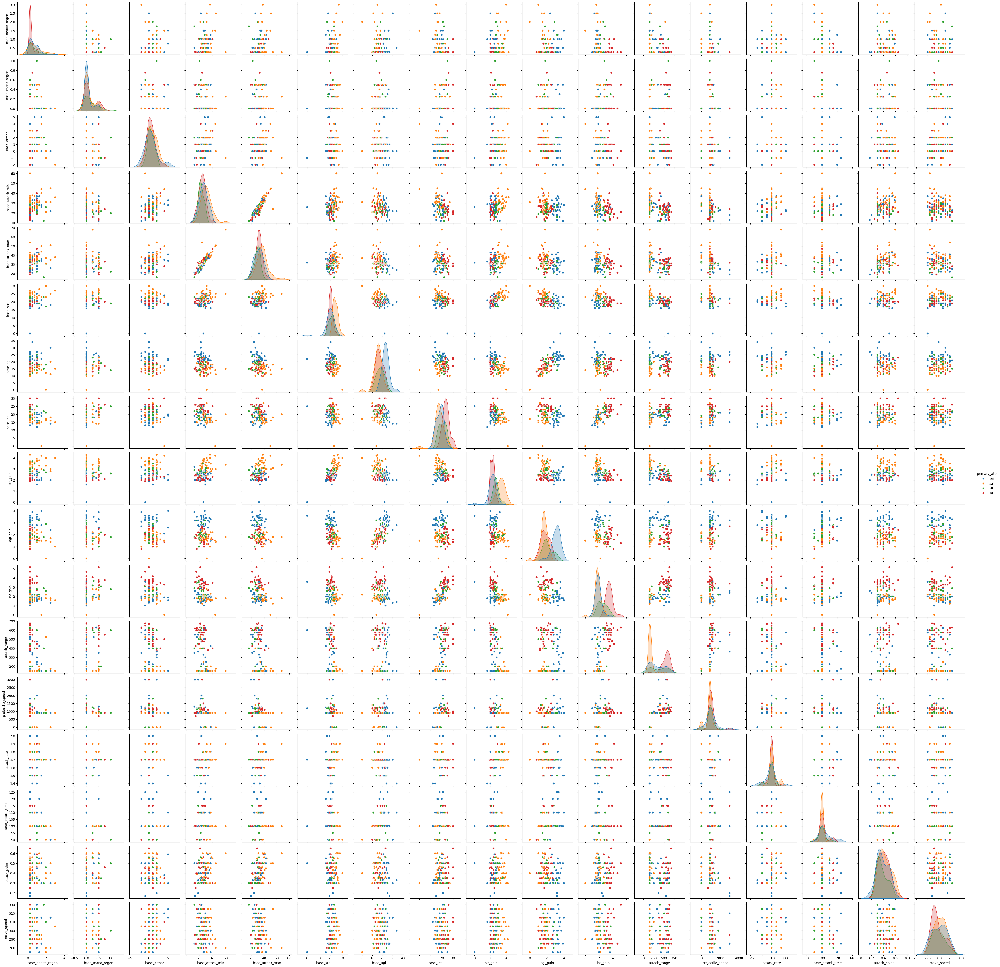

In [ ]:
# The use of magnifying glass is recommended
sns.pairplot(
    pd.concat([heroes_df.loc[:, "primary_attr"], 
           heroes_df.loc[:, numerical_cols[:-23]].drop(labels=["day_vision", "night_vision", "legs", "base_mana"], axis=1)], axis=1),
           hue="primary_attr"
)

We can see the following:
- Main stat dierctly influences other stats gain amount:
    * Intelligence-based heroes have the highest int gain;
    * Strength-based heroes have the highest str gain;
    * Agility-based heroes have the highest agi gain;
    * Universal heroes have reduced gain of all stats. 
    However, they recieve damage increase from every stat instead of a single one.
- The same logic goes for base amount of each stat.

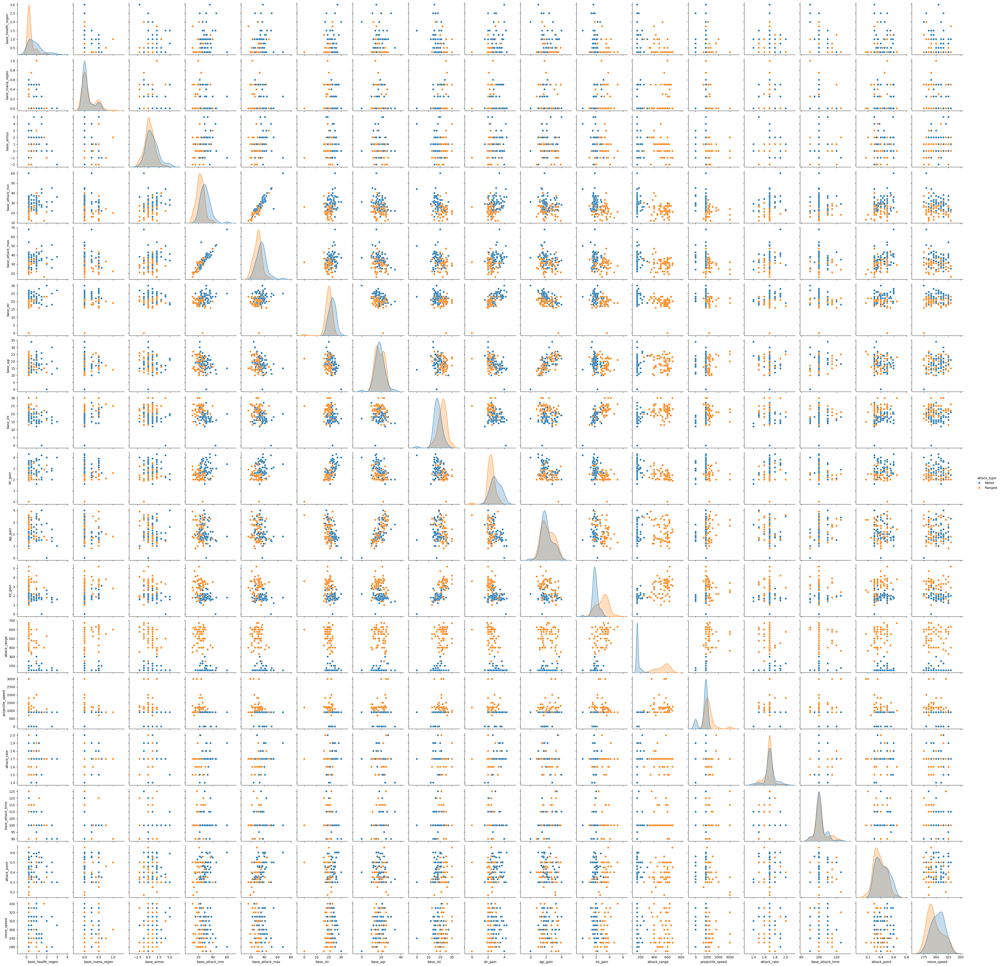

In [ ]:
# The use of magnifying glass is recommended
sns.pairplot(
    pd.concat([heroes_df.loc[:, "attack_type"], 
           heroes_df.loc[:, numerical_cols[:-23]].drop(labels=["day_vision", "night_vision", "legs", "base_mana"], axis=1)], axis=1),
           hue="attack_type"
)

We can see the following:
- Ranged heroes have lower values than melee heroes in the following stats:
    * Base health regen;
    * Base armor;
    * Min/max base attack damage;
    * Base strength;
    * Strength gain.
- Ranged heroes have higher values than melee heroes in the following stats:
    * Base int;
    * Int gain;
    * Attack range (obviously);
    * Projectile speed (obviously too).

We see this distribution because melee heroes require more defensive stats to survive in low-range combat. Usually, their primary purpose is to apply crowd control and protect "carries" - the main damage dealers.

On the other hand, ranged heroes typically are:
- Mages with powerfull damage & support spells;
- "Carries" that deal consistent/burst amount(s) of damage.
Both of these hero classes require careful positioning. In other words, they are "glass cannons".

We can check our assumptions with additional pair plot. As categorical feature we will have `roles` column.

In [66]:
roles = heroes_df.loc[:, "roles"].apply(
    lambda x: np.where(
        "Support" in x and "Carry" in x,
        "all",
        np.where(
            "Support" in x,
            "support",
            "carry"
        )
    )
)
roles.value_counts()

roles
carry      79
support    36
all        11
Name: count, dtype: int64

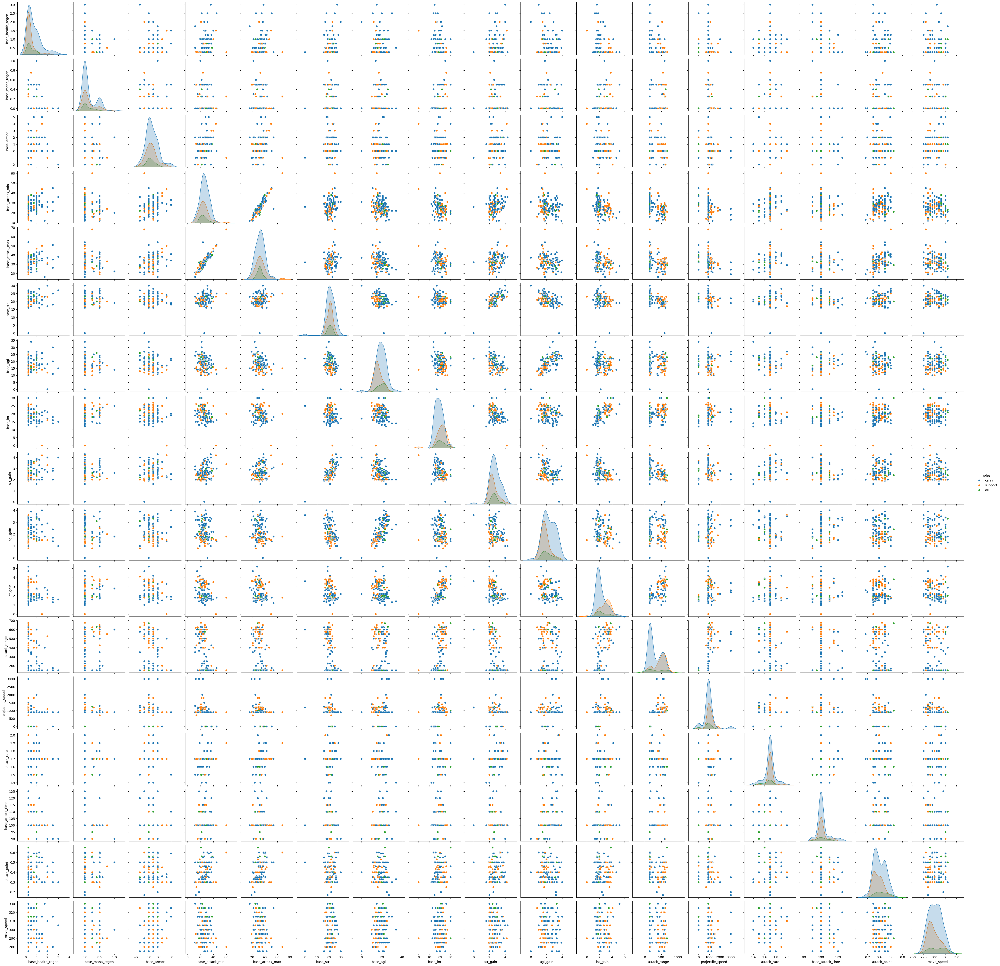

In [67]:
# The use of magnifying glass is recommended
sns.pairplot(
    pd.concat([roles, 
           heroes_df.loc[:, numerical_cols[:-23]].drop(labels=["day_vision", "night_vision", "legs", "base_mana"], axis=1)], axis=1),
           hue="roles"
)

As you can see, this plot confirms our assumptions. Even though, the distributions are close, compared to previous pair plots.

In [ ]:
# Print all possible roles
mask = r'[A-Z]+[a-z]+'
all_roles = set()
for i in heroes_df.loc[:, "roles"]:
    all_roles.update(re.findall(mask, i))

all_roles

{'Carry',
 'Disabler',
 'Durable',
 'Escape',
 'Initiator',
 'Nuker',
 'Pusher',
 'Support'}

### Main conclusion

Overall, the dataset contains useful data and may be used as an additional data for hero/build prediction as well as our second page which includes statistics for most popular & strong heroes for current patch.

#### What can we do with this dataset?

##### Numerical features:

- `base_mana` can be removed due to 99% of it being the same value;
- `attack_rate` can be divided into 3 categories: "below mean"(0), "mean"(1), "above mean"(2) & encoded ordinally in ascending order;
- `base_attack_time` can be modifed in the same way as `attack_rate`;
- `legs` is a purely cosmetical feature that has no impact on the game. Additionally, this feature has weak correlation with other features. So, it can be omitted;
- `day_vision` & `night_vision` can be omitted on the same terms as `base_mana`;
- `<>_win` / `<>_pick`: each of these pair has a high in-between correlation. Each pair represents pickrate/winrate for each rank. So, we will only use one (two at most) pair(s) for item/build recommendation. Each pair can be combined into one feature or one of its sub-features may be removed.

##### Categorical features:

Categorical features have good distributions & do not require advanced preprocessing so far.

##### Roles:

Make additional feature that includes main role:
- `Carry`;
- `Support`;
- `All`.

Make additional feature that includes other sub-roles:
- `Disabler`;
- `Durable`;
- `Escape`;
- `Initiator`;
- `Nuker`;
- `Pusher`.

In other way, these roles can be preprocessed using One-Hot encoding.